# Laboratory 7: Sampling and Pyramids

# Sampling

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
import sys
import os
from matplotlib import pyplot as plt

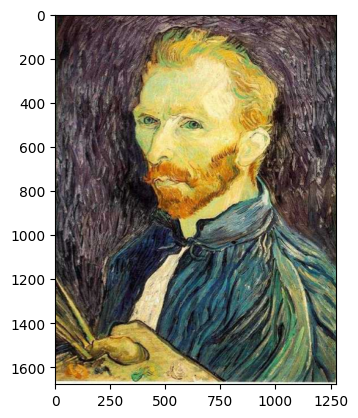

In [3]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/vg.png')
assert img is not None, "file could not be read, check with os.path.exists()"

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## Try to downsampling these images by just removing every 2nd row and column (Naive downsampling)

In [4]:
# Remove every 2nd row and column
# We use ::2 to skip every other row and column
resized_img1 = img[::2, ::2]
resized_img2 = resized_img1[::2, ::2]
resized_img3 = resized_img2[::2, ::2]
resized_img4 = resized_img3[::2, ::2]
resized_img5 = resized_img4[::2, ::2]
resized_img6 = resized_img5[::2, ::2]

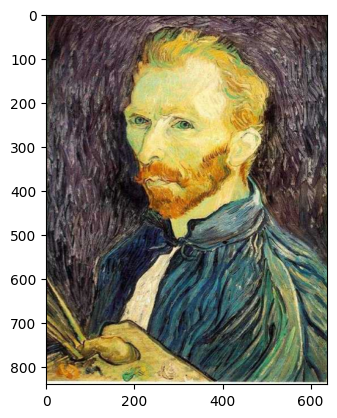

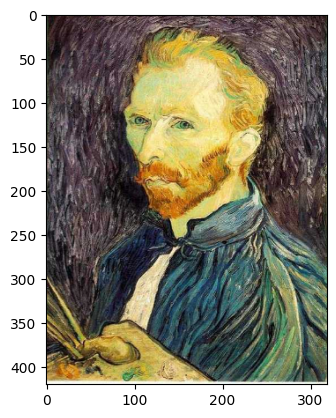

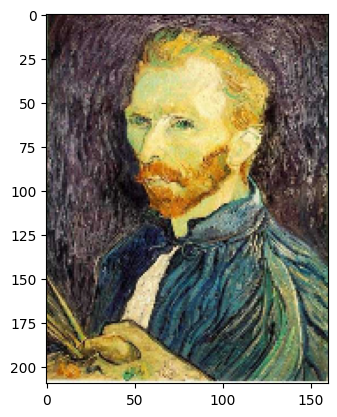

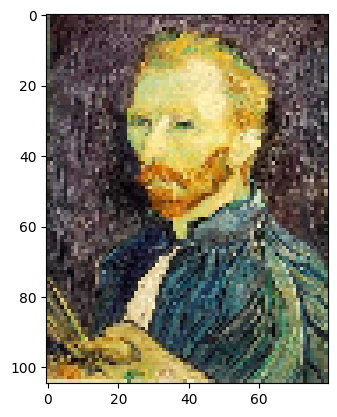

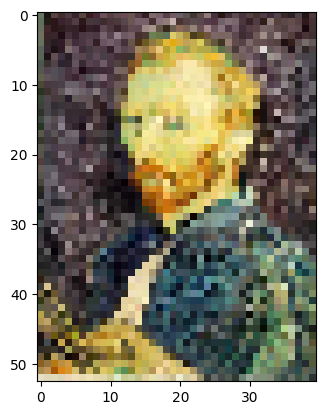

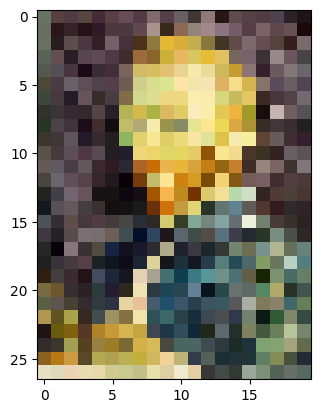

In [5]:
plt.imshow(cv2.cvtColor(resized_img1, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(resized_img2, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(resized_img3, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(resized_img4, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(resized_img5, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(resized_img6, cv2.COLOR_BGR2RGB))
plt.show()

In [7]:
# The above matplotlib may not be clear. Better to see on the image on your own!
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg.png',img)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img1.png',resized_img1)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img2.png',resized_img2)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img3.png',resized_img3)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img4.png',resized_img4)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img5.png',resized_img5)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_resized_img6.png',resized_img6)

True

Check your downsampling images in "Results" folder !

# Image Pyramids

## Basic functions

In [8]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/vg.png')
assert img is not None, "file could not be read, check with os.path.exists()"

In [9]:
# Test pryDown()
lower_reso = cv2.pyrDown(img)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(lower_reso, cv2.COLOR_BGR2RGB))
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [10]:
# generate Gaussian pyramid for A
G = img.copy()
gp = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gp.append(G)

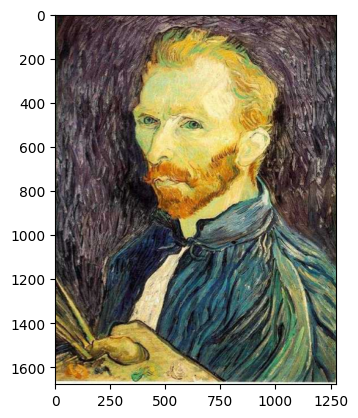

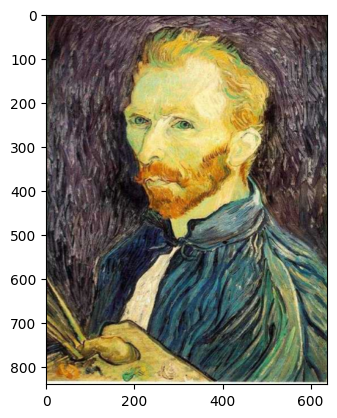

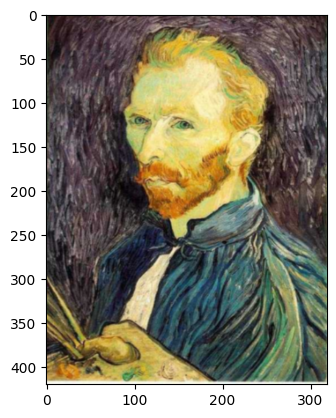

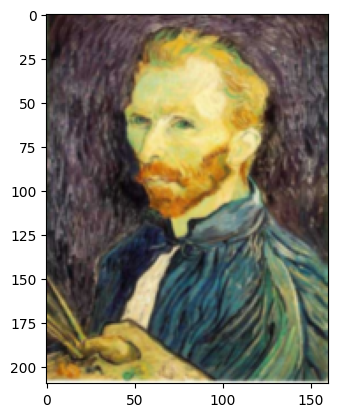

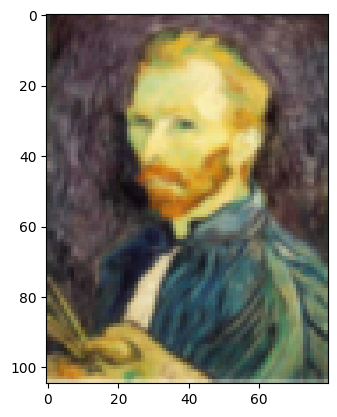

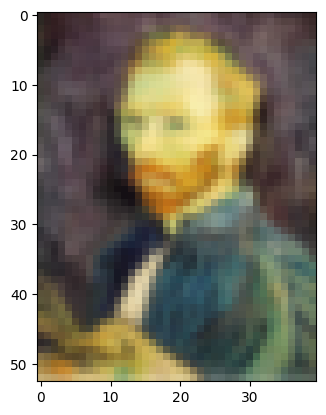

In [23]:
for i in range(6):
    G = gp[i]
    plt.imshow(cv2.cvtColor(G, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/vg_py_resized_img'+str(i)+'.png', G)

## Image Blending using Pyramids

In [12]:
A = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/apple.jpg')
B = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/orange.jpg')
assert A is not None, "file could not be read, check with os.path.exists()"
assert B is not None, "file could not be read, check with os.path.exists()"

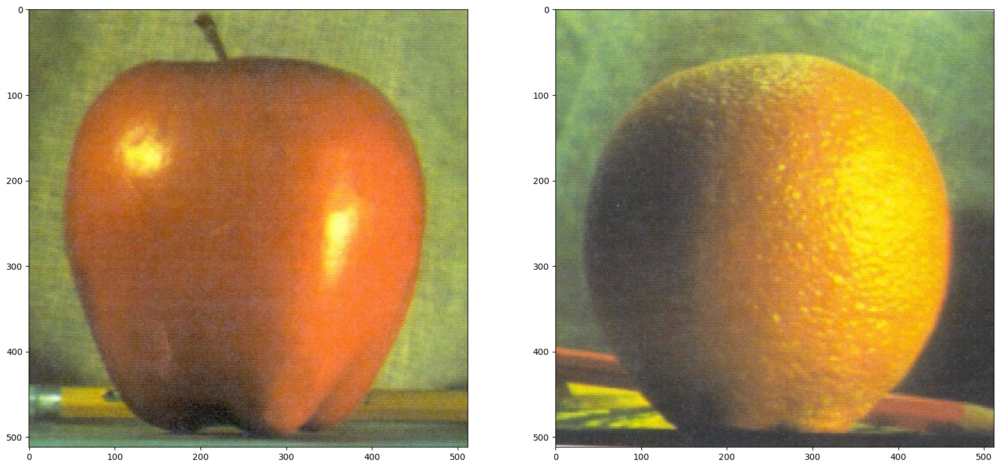

In [13]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [14]:
# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpA.append(G)

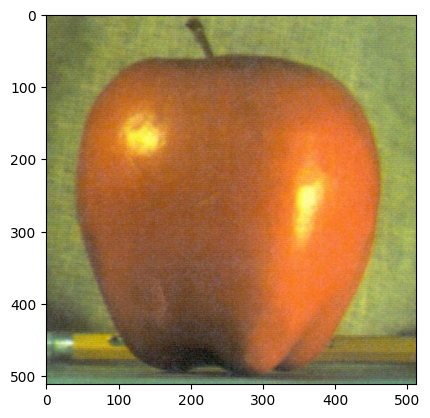

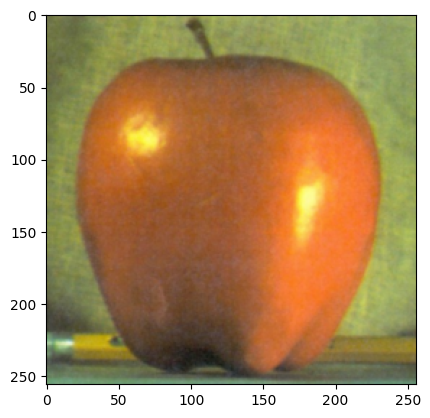

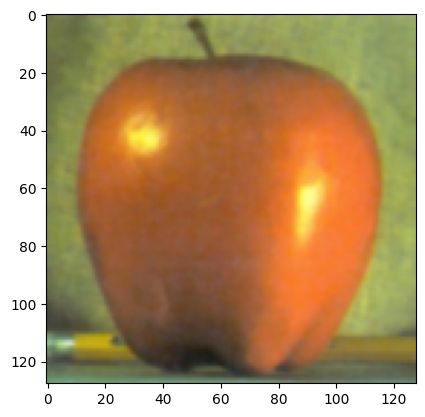

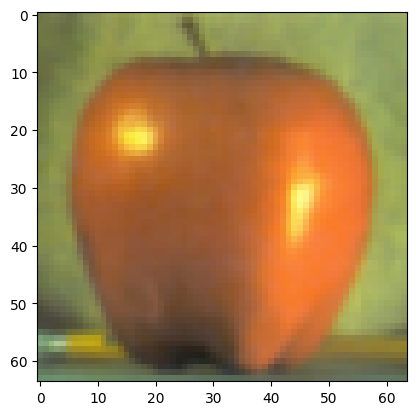

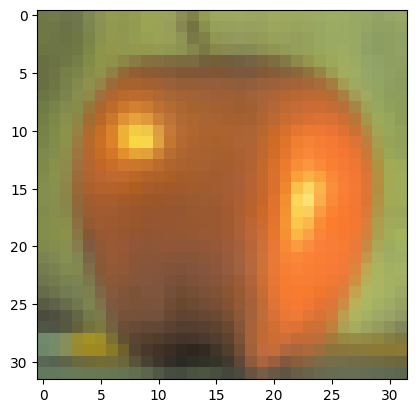

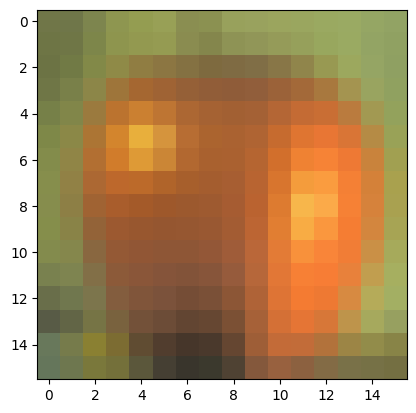

In [24]:
for i in range(6):
    G = gpA[i]
    plt.imshow(cv2.cvtColor(G, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/A_py_resized_img'+str(i)+'.png', G)

In [16]:
# generate Gaussian pyramid for B
G = B.copy()
gpB = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpB.append(G)

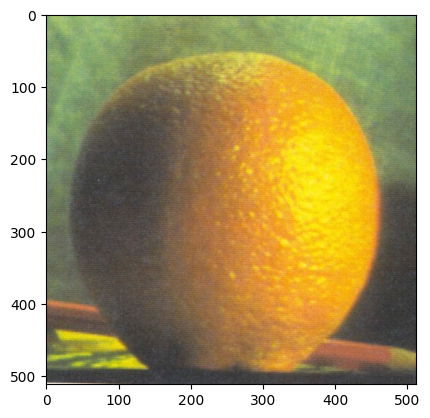

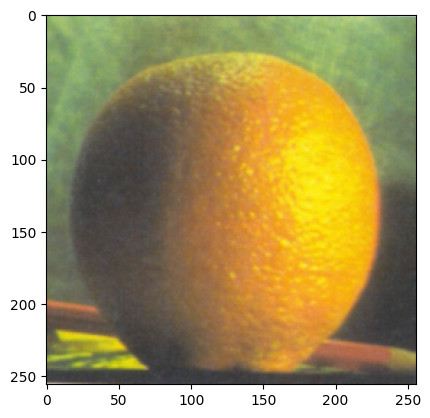

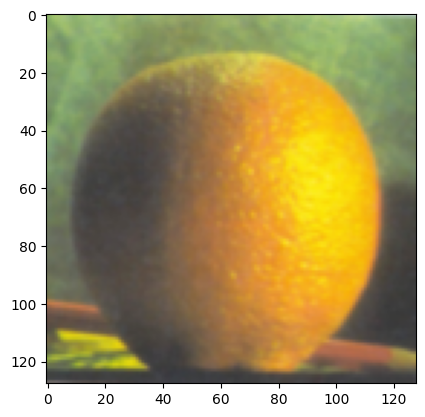

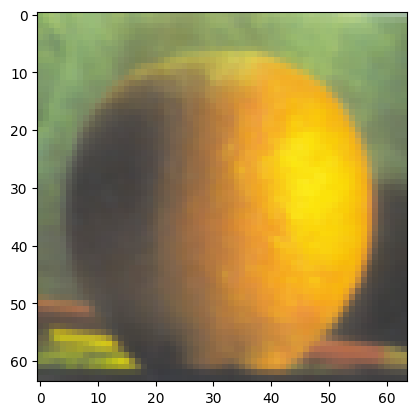

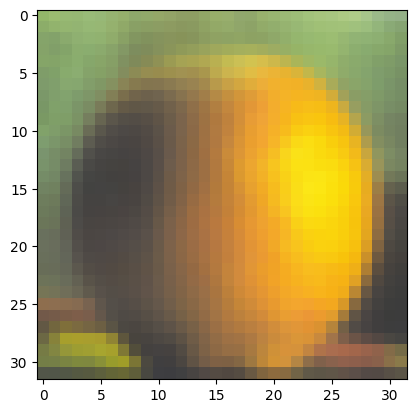

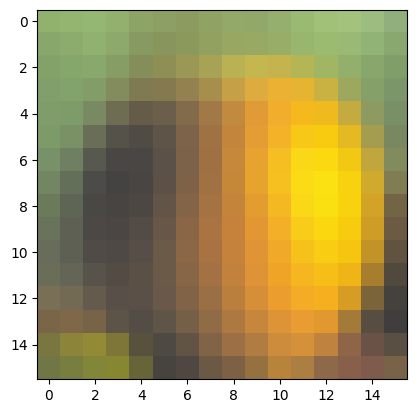

In [25]:
for i in range(6):
    G = gpB[i]
    plt.imshow(cv2.cvtColor(G, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/B_py_resized_img'+str(i)+'.png', G)

In [18]:
# generate Laplacian Pyramid for A
lpA = [gpA[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpA[i])
    L = cv2.subtract(gpA[i-1],GE)
    lpA.append(L)

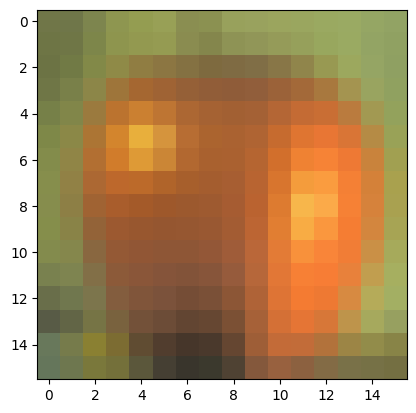

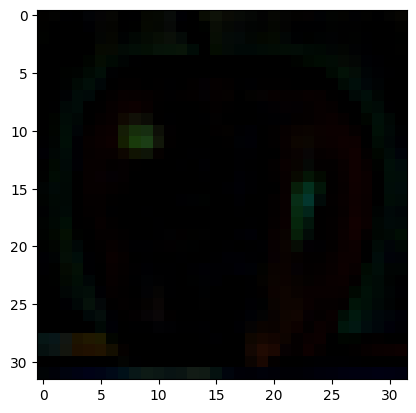

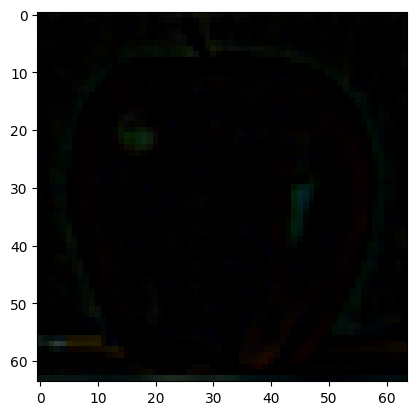

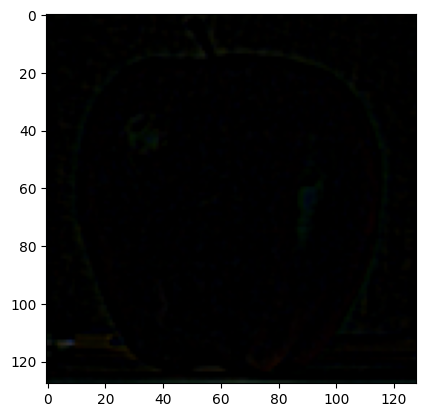

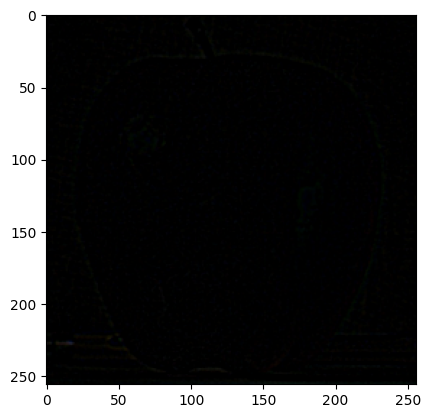

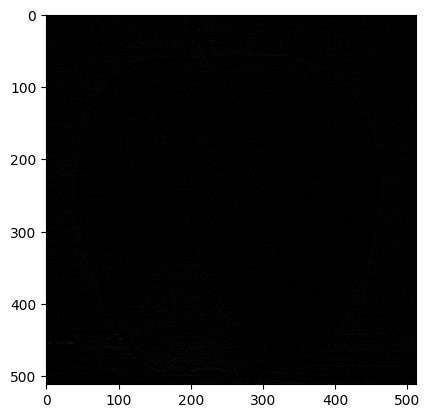

In [26]:
for i in range(6):
    L = lpA[i]
    plt.imshow(cv2.cvtColor(L, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/A_pyL_resized_img'+str(i)+'.png', L)

In [27]:
# generate Laplacian Pyramid for B
lpB = [gpB[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpB[i])
    L = cv2.subtract(gpB[i-1],GE)
    lpB.append(L)


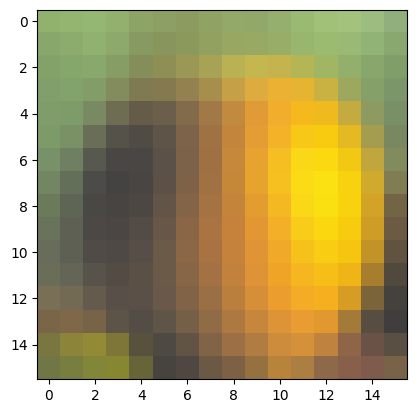

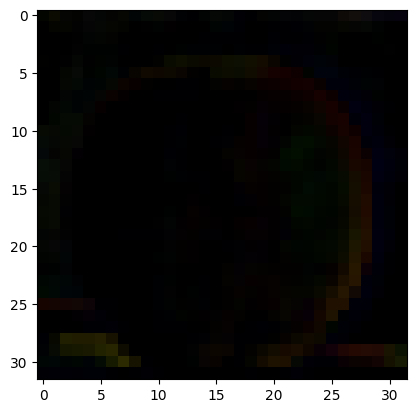

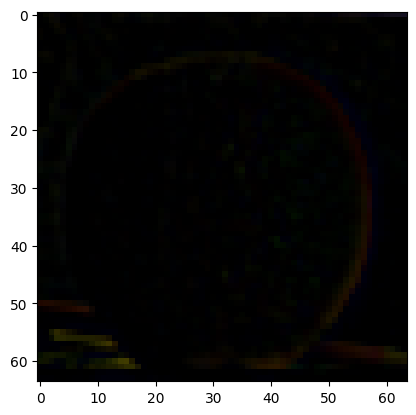

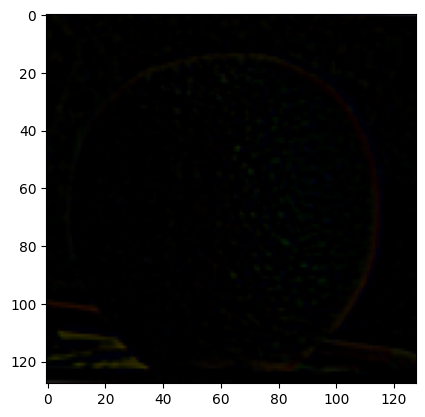

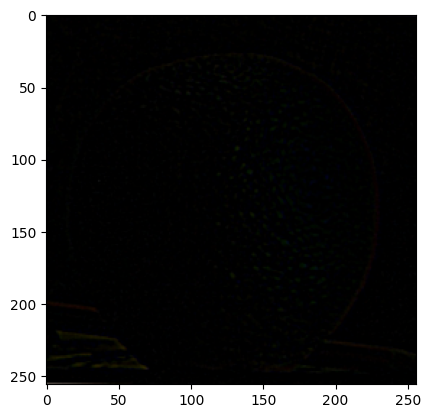

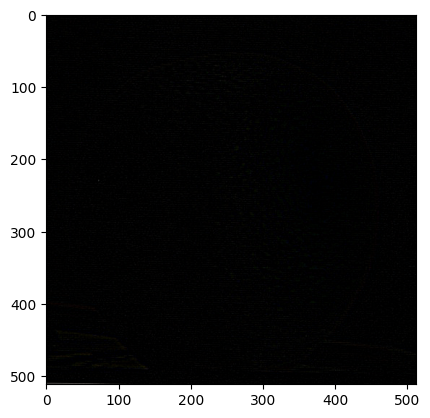

In [28]:
for i in range(6):
    L = lpB[i]
    plt.imshow(cv2.cvtColor(L, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/B_pyL_resized_img'+str(i)+'.png', L)

In [29]:
# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpA,lpB):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)


In [30]:
# now reconstruct
ls_ = LS[0]
for i in range(1,6):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, LS[i])

# image with direct connecting each half
real = np.hstack((A[:,:cols//2],B[:,cols//2:]))

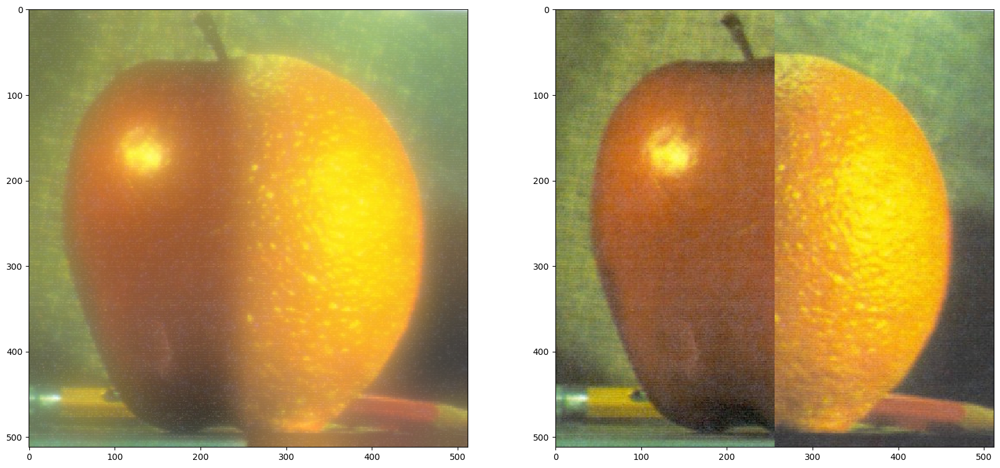

In [31]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(ls_, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(real, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [32]:
# save the images
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/Pyramid_blending.jpg',ls_)
cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/Direct_blending.jpg',real)

True

# Geometric Transformation

## Scaling

In [33]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/lenna.png', cv2.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"

res = cv2.resize(img, None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)

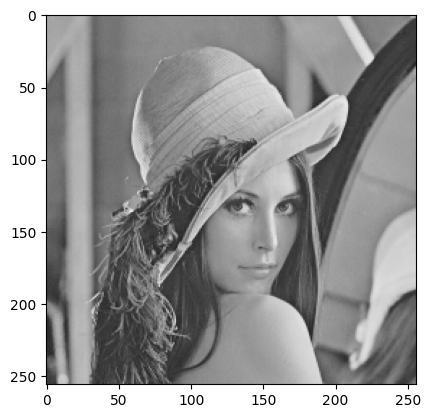

In [34]:
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
plt.show()

## Translation

In [35]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/lenna.png', cv2.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"

rows,cols = img.shape

M = np.float32([[1,0,100],[0,1,50]])
dst = cv2.warpAffine(img,M,(cols,rows))

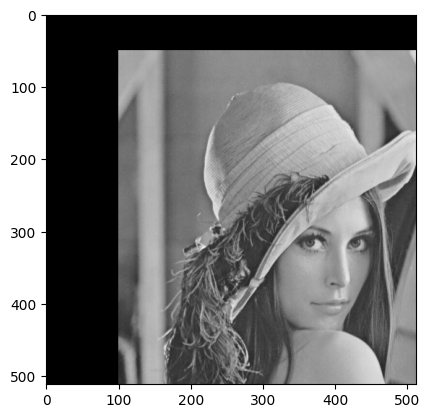

In [36]:
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
plt.show()

## Rotation

In [37]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/lenna.png', cv2.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"

rows,cols = img.shape

# cols-1 and rows-1 are the coordinate limits.
M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),90,1)
dst = cv2.warpAffine(img,M,(cols,rows))

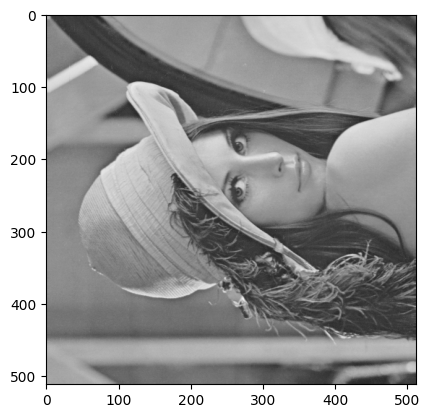

In [38]:
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
plt.show()

## Affine Transformation


In [39]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/sudoku.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"

rows,cols,ch = img.shape

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
dst = cv2.warpAffine(img,M,(cols,rows))

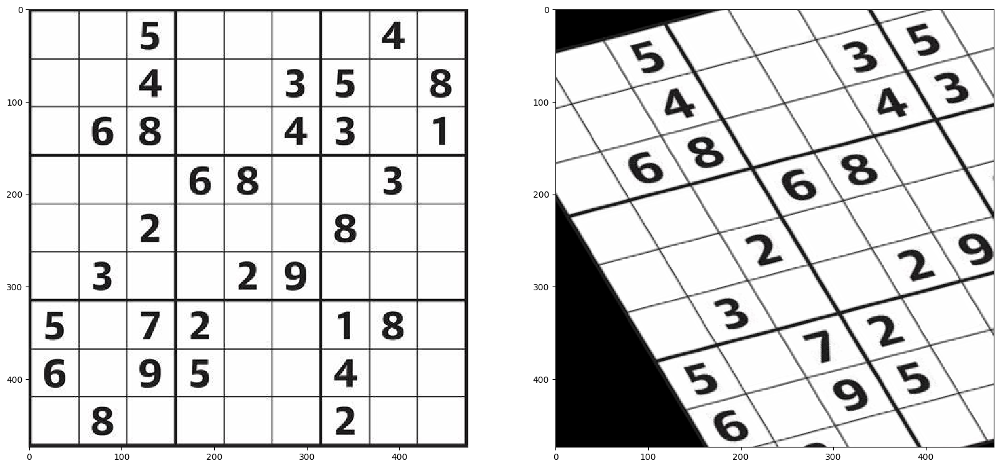

In [40]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Perspective Transformation

In [41]:
img = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/sudoku.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"

rows,cols,ch = img.shape

pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
M = cv2.getPerspectiveTransform(pts1,pts2)
dst = cv2.warpPerspective(img,M,(300,300))

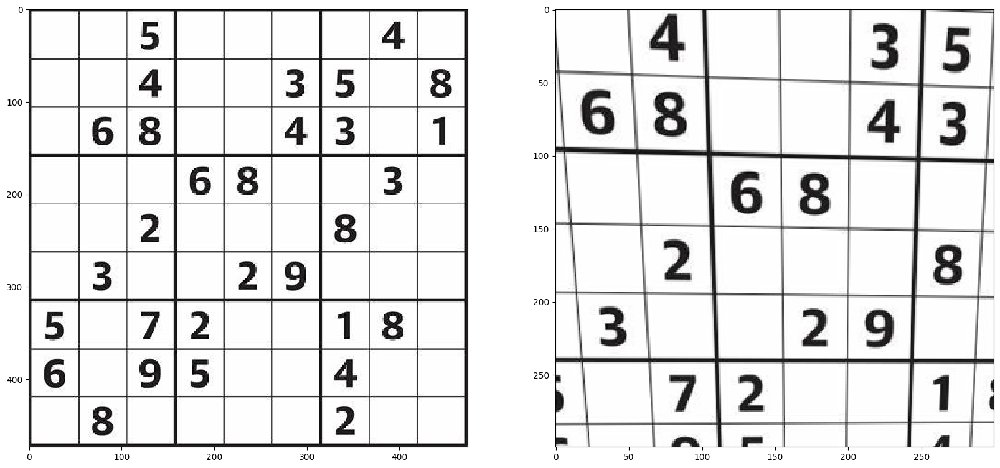

In [42]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Assignment 1: Pyramid Blending and Geometric transformation

In [ ]:
# Assignment 1: Pyramid Blending
# 1. Get your own image: Find two images of your choice. Try to use the Pyramid Blending algorithm with the your own images
# 2. Play with pyramids: Try to increase or decrease the number of pyramid level, and observe the results.
# 3. Geometric transformation: Images are not usually perfectly fit, use the geometric transformation to align two of your images,
#    and get the best blending images as much as you can

# Add you code here

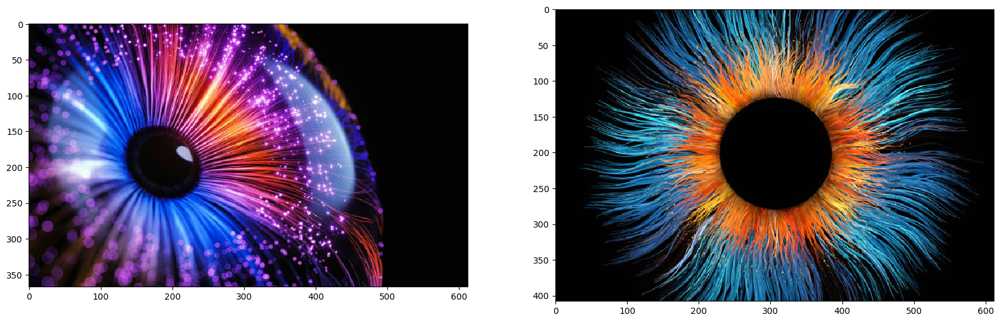

In [232]:
#I select 2 image
eye = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/eye.jpg')
hole = cv2.imread('/content/drive/MyDrive/Computer vision/lab07/Images/hole.jpg')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(eye, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(hole, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [233]:
print("eye shape = ",eye.shape)
print("hole shape = ",hole.shape)

eye shape =  (367, 612, 3)
hole shape =  (408, 612, 3)


In [234]:
resized_eye = eye[:256,:256]
resized_hole = hole[:256,:256]

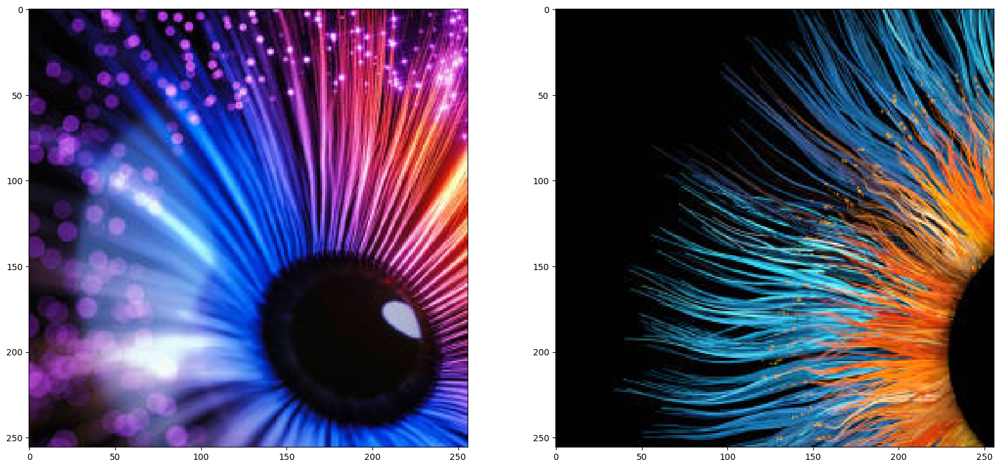

eye shape =  (256, 256, 3)
hole shape =  (256, 256, 3)


In [235]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(resized_eye, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(resized_hole, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

print("eye shape = ",resized_eye.shape)
print("hole shape = ",resized_hole.shape)

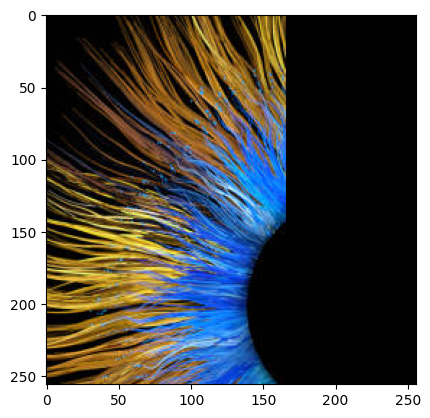

In [236]:
M = np.float32([[1,0,-90],[0,1,0]])
dst = cv2.warpAffine(resized_hole,M,(256, 256))

plt.imshow(dst)
resized_hole = dst

In [237]:
# generate Gaussian pyramid for eye
E1 = resized_eye.copy()
gpE1 = [E1]
for i in range(6):
    E1 = cv2.pyrDown(E1)
    gpE1.append(E1)

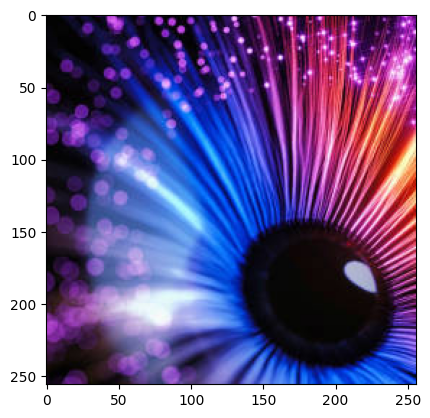

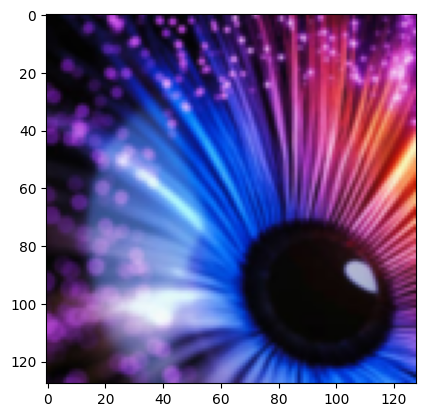

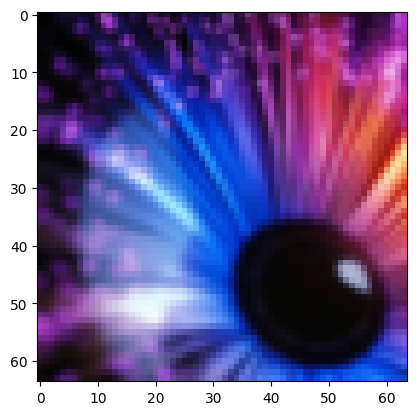

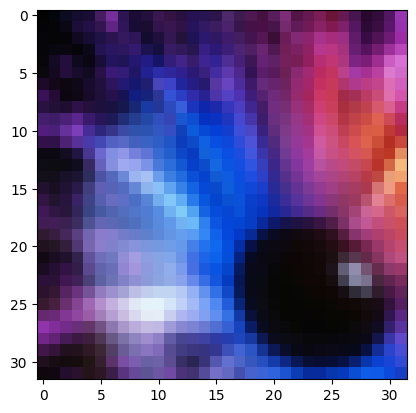

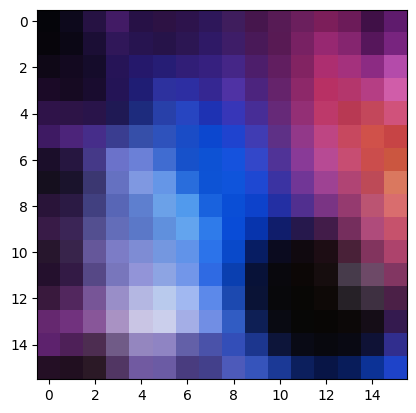

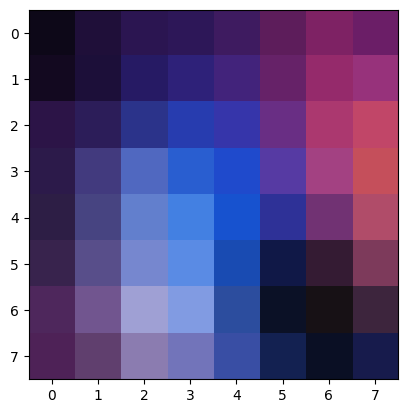

In [238]:
for i in range(6):
    E1 = gpE1[i]
    plt.imshow(cv2.cvtColor(E1, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/eye_py_resized_img'+str(i)+'.png', E1)

In [239]:
# generate Gaussian pyramid for eye
E2 = resized_hole.copy()
gpE2 = [E2]
for i in range(6):
    E2 = cv2.pyrDown(E2)
    gpE2.append(E2)

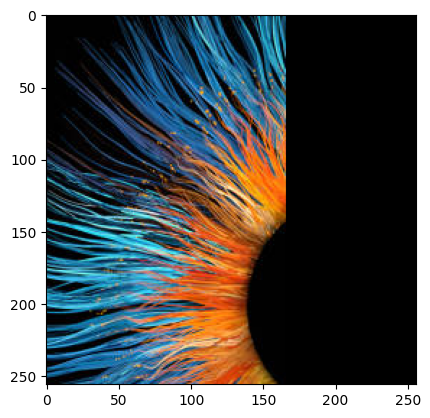

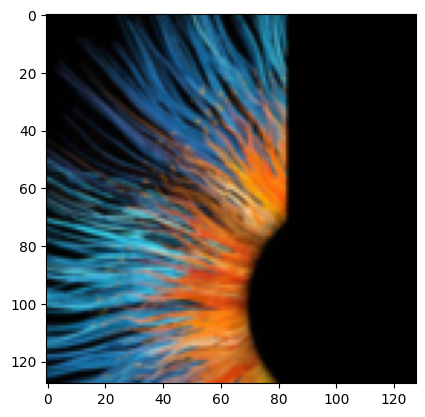

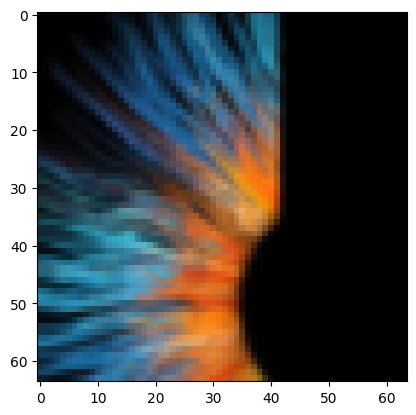

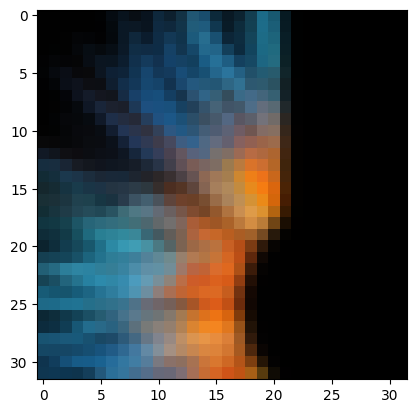

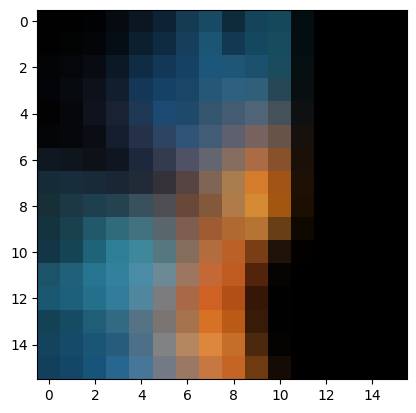

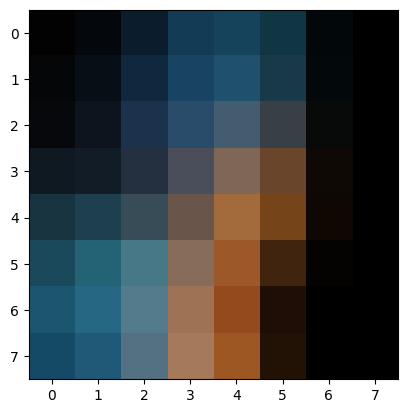

In [240]:
for i in range(6):
    E2 = gpE2[i]
    plt.imshow(cv2.cvtColor(E2, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/hole_py_resized_img'+str(i)+'.png', E2)

In [241]:
#line shape

In [242]:
# generate Laplacian Pyramid for A
lpA = [gpE1[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpE1[i])
    L = cv2.subtract(gpE1[i-1],GE)
    lpA.append(L)

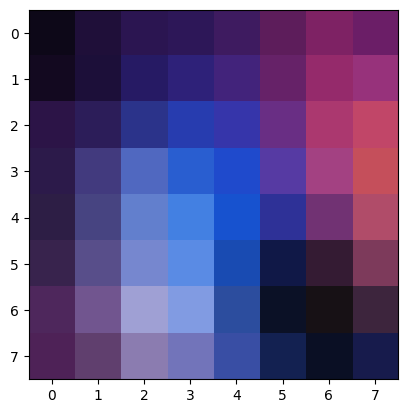

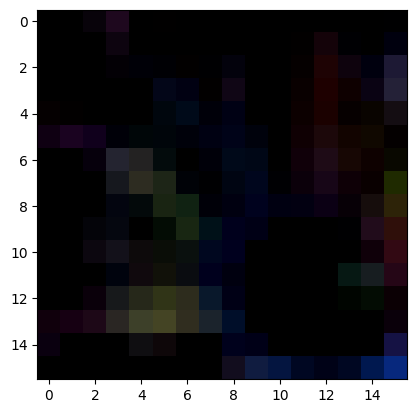

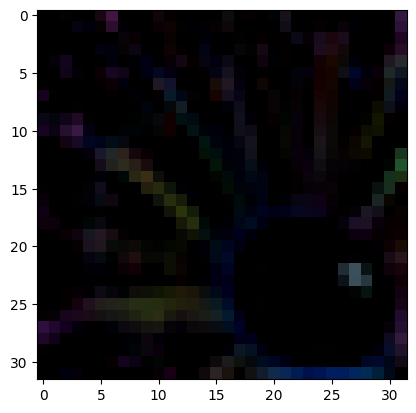

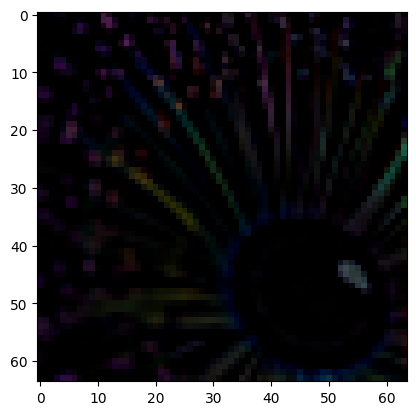

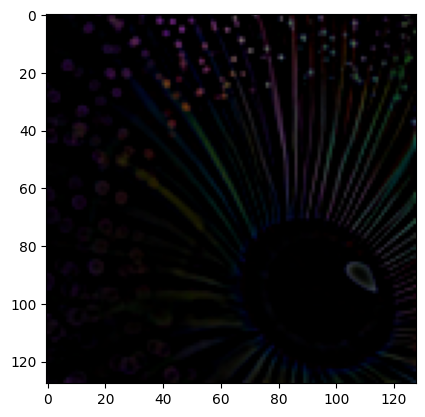

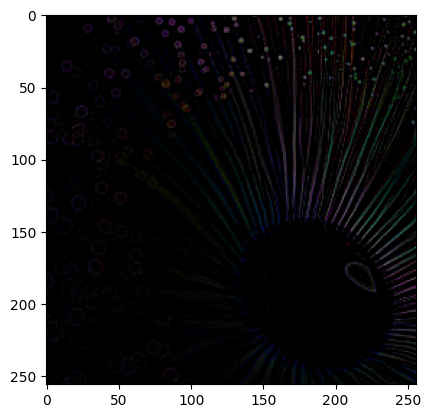

In [243]:
for i in range(6):
    L = lpA[i]
    plt.imshow(cv2.cvtColor(L, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/A_pyL_resized_img'+str(i)+'.png', L)

In [244]:
# generate Laplacian Pyramid for B
lpB = [gpE2[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpE2[i])
    L = cv2.subtract(gpE2[i-1],GE)
    lpB.append(L)

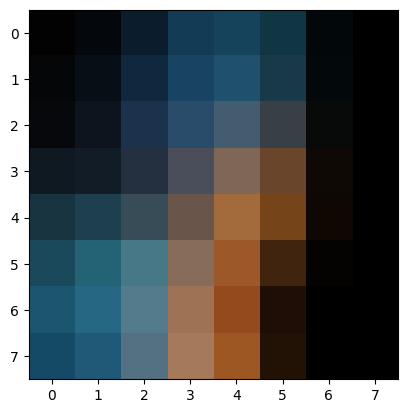

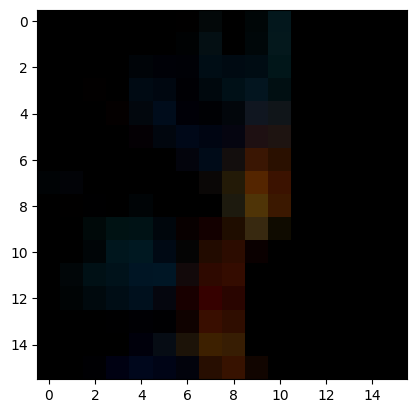

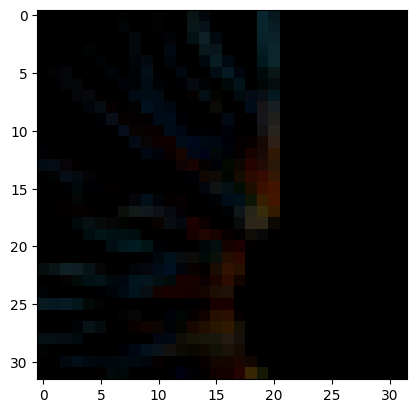

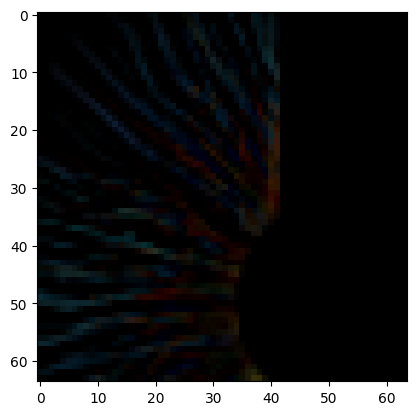

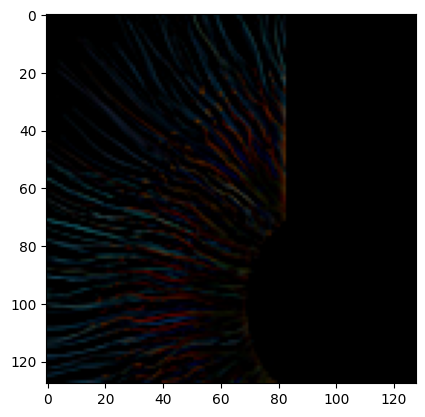

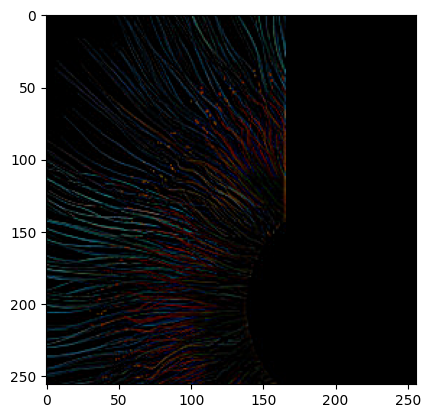

In [245]:
for i in range(6):
    L = lpB[i]
    plt.imshow(cv2.cvtColor(L, cv2.COLOR_BGR2RGB))
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Computer vision/lab07/Results/A_pyL_resized_img'+str(i)+'.png', L)

In [246]:
# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpB,lpA):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)


In [247]:
# now reconstruct
ls_ = LS[0]
for i in range(1,6):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, LS[i])

# image with direct connecting each half
real = np.hstack((resized_eye[:,:cols//2],resized_hole[:,cols//2:]))

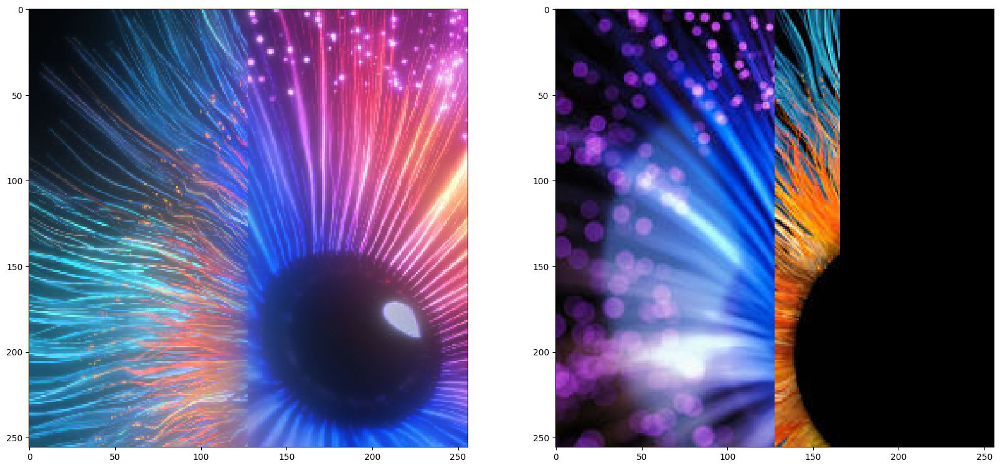

In [248]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(ls_, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(cv2.cvtColor(real, cv2.COLOR_BGR2RGB), cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()